## Setup

### Before you start

Let's make sure that we have access to GPU. We can use `nvidia-smi` command to do that. In case of any problems navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`.

In [1]:
!nvidia-smi

Sat Jul  5 23:42:52 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   43C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

**NOTE:** To make it easier for us to manage datasets, images and models we create a `HOME` constant.

In [2]:
import os
HOME = os.getcwd()
print("HOME:", HOME)

HOME: /content


### Install SAM2 and dependencies

In [3]:
!git clone https://github.com/facebookresearch/segment-anything-2.git
%cd {HOME}/segment-anything-2
!pip install -e . -q

Cloning into 'segment-anything-2'...
remote: Enumerating objects: 1070, done.
remote: Total 1070 (delta 0), reused 0 (delta 0), pack-reused 1070 (from 1)
Receiving objects: 100% (1070/1070), 128.11 MiB | 25.15 MiB/s, done.
Resolving deltas: 100% (381/381), done.
/content/segment-anything-2
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 2.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 10.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 91.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 71.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 48

In [4]:
!pip install -q supervision jupyter_bbox_widget

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 181.5/181.5 kB 9.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 220.7/220.7 kB 14.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 837.4/837.4 kB 38.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 47.9 MB/s eta 0:00:00


### Download SAM2 checkpoints

**NOTE:** SAM2 is available in 4 different model sizes ranging from the lightweight "sam2_hiera_tiny" (38.9M parameters) to the more powerful "sam2_hiera_large" (224.4M parameters).

In [5]:
# Download latest SAM 2.1 model checkpoints (September 2024)
!mkdir -p {HOME}/checkpoints
!wget -q https://dl.fbaipublicfiles.com/segment_anything_2/092824/sam2.1_hiera_tiny.pt -P {HOME}/checkpoints
!wget -q https://dl.fbaipublicfiles.com/segment_anything_2/092824/sam2.1_hiera_small.pt -P {HOME}/checkpoints
!wget -q https://dl.fbaipublicfiles.com/segment_anything_2/092824/sam2.1_hiera_base_plus.pt -P {HOME}/checkpoints
!wget -q https://dl.fbaipublicfiles.com/segment_anything_2/092824/sam2.1_hiera_large.pt -P {HOME}/checkpoints

### Download example data

**NONE:** Let's download few example images. Feel free to use your images or videos.

In [6]:
# Download example images
!mkdir -p {HOME}/data
!wget -q https://media.roboflow.com/notebooks/examples/dog.jpeg -P {HOME}/data
!wget -q https://media.roboflow.com/notebooks/examples/dog-2.jpeg -P {HOME}/data
!wget -q https://media.roboflow.com/notebooks/examples/dog-3.jpeg -P {HOME}/data
!wget -q https://media.roboflow.com/notebooks/examples/dog-4.jpeg -P {HOME}/data

### Imports

In [7]:
import cv2
import torch
import base64

import numpy as np
import supervision as sv

from sam2.build_sam import build_sam2
from sam2.sam2_image_predictor import SAM2ImagePredictor
from sam2.automatic_mask_generator import SAM2AutomaticMaskGenerator

**NOTE:** This code enables mixed-precision computing for faster deep learning. It uses bfloat16 for most calculations and, on newer NVIDIA GPUs, leverages TensorFloat-32 (TF32) for certain operations to further boost performance.

In [8]:
torch.autocast(device_type="cuda", dtype=torch.bfloat16).__enter__()

if torch.cuda.get_device_properties(0).major >= 8:
    torch.backends.cuda.matmul.allow_tf32 = True
    torch.backends.cudnn.allow_tf32 = True

## Load model





In [9]:
# Model configuration for SAM 2.1
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
CHECKPOINT = f"{HOME}/checkpoints/sam2.1_hiera_large.pt"
CONFIG = "configs/sam2.1/sam2.1_hiera_l.yaml"

# Load the SAM 2.1 model
sam2_model = build_sam2(CONFIG, CHECKPOINT, device=DEVICE, apply_postprocessing=False)

## Automated mask generation

Since SAM 2 can efficiently process prompts, masks for the entire image can be generated by sampling a large number of prompts over an image.

The class `SAM2AutomaticMaskGenerator` implements this capability. It works by sampling single-point input prompts in a grid over the image, from each of which SAM can predict multiple masks. Then, masks are filtered for quality and deduplicated using non-maximal suppression. Additional options allow for further improvement of mask quality and quantity, such as running prediction on multiple crops of the image or postprocessing masks to remove small disconnected regions and holes.

In [10]:
mask_generator = SAM2AutomaticMaskGenerator(sam2_model)

**NOTE:** OpenCV loads images in BGR format by default, so we convert to RGB for compatibility with the mask generator.

In [12]:
IMAGE_PATH = f"{HOME}/rgb/rgb_00001.png"

image_bgr = cv2.imread(IMAGE_PATH)
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

sam2_result = mask_generator.generate(image_rgb)

### Output format

`SAM2AutomaticMaskGenerator` returns a `list` of masks, where each mask is a `dict` containing various information about the mask:

* `segmentation` - `[np.ndarray]` - the mask with `(W, H)` shape, and `bool` type
* `area` - `[int]` - the area of the mask in pixels
* `bbox` - `[List[int]]` - the boundary box of the mask in `xywh` format
* `predicted_iou` - `[float]` - the model's own prediction for the quality of the mask
* `point_coords` - `[List[List[float]]]` - the sampled input point that generated this mask
* `stability_score` - `[float]` - an additional measure of mask quality
* `crop_box` - `List[int]` - the crop of the image used to generate this mask in `xywh` format

### Results visualisation

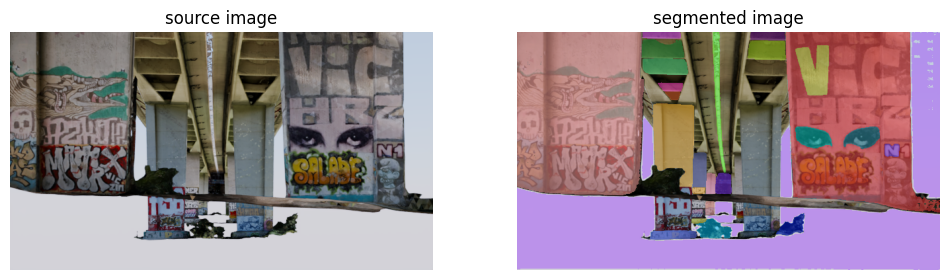

In [13]:
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)
detections = sv.Detections.from_sam(sam_result=sam2_result)

annotated_image = mask_annotator.annotate(scene=image_bgr.copy(), detections=detections)

sv.plot_images_grid(
    images=[image_bgr, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

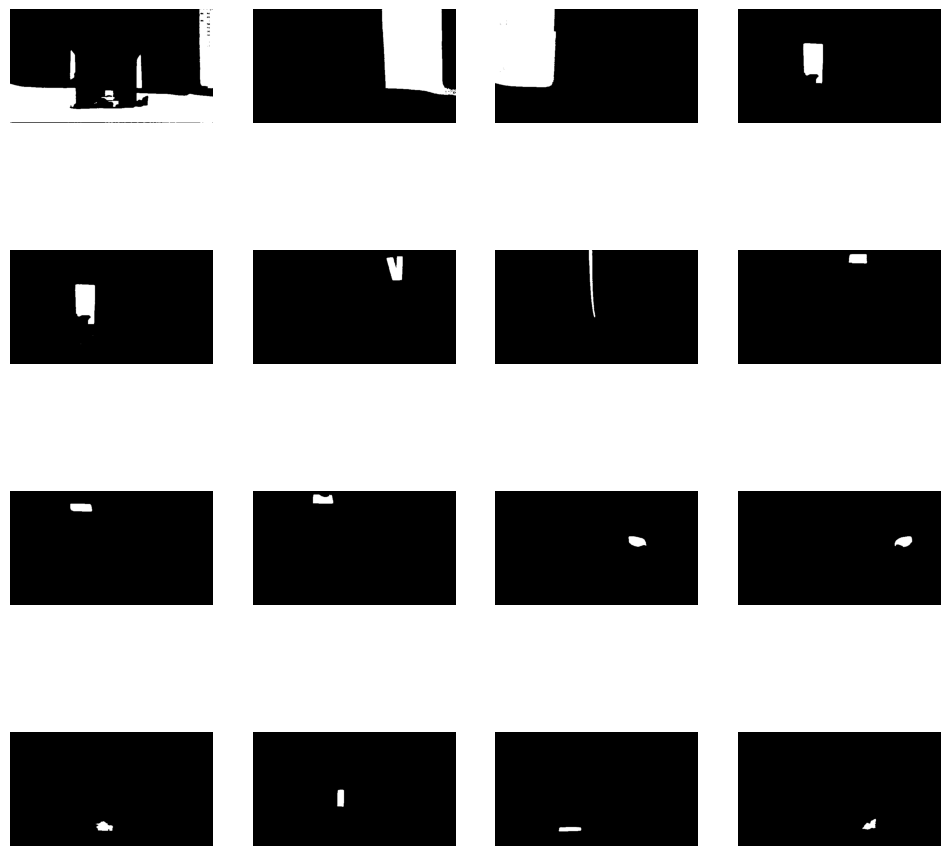

In [14]:
masks = [
    mask['segmentation']
    for mask
    in sorted(sam2_result, key=lambda x: x['area'], reverse=True)
]

sv.plot_images_grid(
    images=masks[:16],
    grid_size=(4, 4),
    size=(12, 12)
)

### Advanced automatic mask generation options

There are several tunable parameters in automatic mask generation that control how densely points are sampled and what the thresholds are for removing low quality or duplicate masks. Additionally, generation can be automatically run on crops of the image to get improved performance on smaller objects, and post-processing can remove stray pixels and holes.

- `points_per_side` `[int or None]` - the number of points to be sampled
along one side of the image. The total number of points is
`points_per_side**2`. If `None`, `point_grids` must provide explicit
point sampling.
- `points_per_batch` - `[int]` - sets the number of points run simultaneously
by the model. Higher numbers may be faster but use more GPU memory.
- `pred_iou_thresh` `[float]` - a filtering threshold in `[0,1]`, using the
model's predicted mask quality.
- `stability_score_thresh` - `[float]` - a filtering threshold in `[0,1]`, using
the stability of the mask under changes to the cutoff used to binarize
the model's mask predictions.
- `stability_score_offset` - `[float]` - the amount to shift the cutoff when
calculated the stability score.
- `mask_threshold` - `[float]` - threshold for binarizing the mask logits
- `box_nms_thresh` - `[float]` - the box IoU cutoff used by non-maximal
suppression to filter duplicate masks.
- `crop_n_layers` - `[int]` - if `>0`, mask prediction will be run again on
crops of the image. Sets the number of layers to run, where each
layer has `2**i_layer` number of image crops.
- `crop_nms_thresh` - `[float]` - the box IoU cutoff used by non-maximal
suppression to filter duplicate masks between different crops.
- `crop_overlap_ratio` - `[float]` - sets the degree to which crops overlap.
In the first crop layer, crops will overlap by this fraction of
the image length. Later layers with more crops scale down this overlap.
- `crop_n_points_downscale_factor` - `[int]` - the number of points-per-side
sampled in layer `n` is scaled down by `crop_n_points_downscale_factor**n`.
- `point_grids` - `[List[np.ndarray] or None]` - a list over explicit grids
of points used for sampling, normalized to `[0,1]`. The nth grid in the
list is used in the nth crop layer. Exclusive with points_per_side.
- `min_mask_region_area` - `[int]` - if `>0`, postprocessing will be applied
to remove disconnected regions and holes in masks with area smaller
than `min_mask_region_area`. Requires opencv.

In [15]:
mask_generator_2 = SAM2AutomaticMaskGenerator(
    model=sam2_model,
    points_per_side=64,
    points_per_batch=128,
    pred_iou_thresh=0.7,
    stability_score_thresh=0.92,
    stability_score_offset=0.7,
    crop_n_layers=1,
    box_nms_thresh=0.7,
)

In [16]:
sam2_result_2 = mask_generator_2.generate(image_rgb)

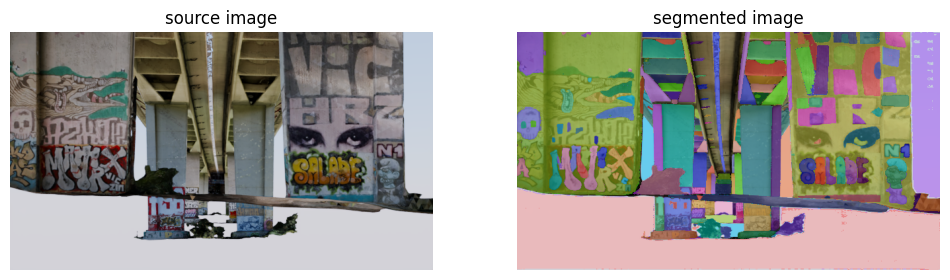

In [17]:
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)
detections = sv.Detections.from_sam(sam_result=sam2_result_2)

annotated_image = mask_annotator.annotate(scene=image_bgr.copy(), detections=detections)

sv.plot_images_grid(
    images=[image_bgr, annotated_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

## Prompting with boxes

The `SAM2ImagePredictor` class provides an easy interface to the model for prompting the model. It allows the user to first set an image using the `set_image` method, which calculates the necessary image embeddings. Then, prompts can be provided via the `predict` method to efficiently predict masks from those prompts. The model can take as input both point and box prompts, as well as masks from the previous iteration of prediction.

In [18]:
predictor = SAM2ImagePredictor(sam2_model)

In [19]:
IMAGE_PATH = f"{HOME}/rgb/rgb_00001.png"

image_bgr = cv2.imread(IMAGE_PATH)
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

### Interactive box prompt

In [20]:
def encode_image(filepath):
    with open(filepath, 'rb') as f:
        image_bytes = f.read()
    encoded = str(base64.b64encode(image_bytes), 'utf-8')
    return "data:image/jpg;base64,"+encoded

**NOTE:** Execute cell below and use your mouse to **draw bounding box** on the image 👇

In [21]:
IS_COLAB = True

if IS_COLAB:
    from google.colab import output
    output.enable_custom_widget_manager()

from jupyter_bbox_widget import BBoxWidget

widget = BBoxWidget()
widget.image = encode_image(IMAGE_PATH)
widget

BBoxWidget(colors=['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#b…

In [22]:
widget.bboxes

[{'x': 1, 'y': 0, 'width': 220, 'height': 278, 'label': ''}]

**NOTE:** `Sam2ImagePredictor.predict` method takes `np.ndarray` `box` argument in `[x_min, y_min, x_max, y_max]` format.

In [23]:
default_box = [
    {'x': 166, 'y': 835, 'width': 99, 'height': 175, 'label': ''},
    {'x': 472, 'y': 885, 'width': 168, 'height': 249, 'label': ''},
    {'x': 359, 'y': 727, 'width': 27, 'height': 155, 'label': ''},
    {'x': 164, 'y': 1044, 'width': 279, 'height': 163, 'label': ''}
]

boxes = widget.bboxes if widget.bboxes else default_box
boxes = np.array([
    [
        box['x'],
        box['y'],
        box['x'] + box['width'],
        box['y'] + box['height']
    ] for box in boxes
])

### Generate masks with SAM

**NOTE:** Process the image to produce an image embedding by calling `SAM2ImagePredictor.set_image`. `SAM2ImagePredictor` remembers this embedding and will use it for subsequent mask prediction. `SAM2ImagePredictor.predict` takes the following arguments:

- `point_coords` - `[np.ndarray or None]` - a `Nx2` array of point prompts to the model. Each point is in `(X,Y)` in pixels.
- `point_labels` - `[np.ndarray or None]` - a length `N` array of labels for the
point prompts. `1` indicates a foreground point and `0` indicates a
background point.
- `box` - `[np.ndarray or None]` - a length `4` array given a box prompt to the
model, in `[x_min, y_min, x_max, y_max]` format.
- `mask_input` - `[np.ndarray]` - a low resolution mask input to the model, typically coming from a previous prediction iteration. Has form `1xHxW`, where
for SAM, `H=W=256`.
- `multimask_output` - `[bool]` - if true, the model will return three masks.
For ambiguous input prompts (such as a single click), this will often
produce better masks than a single prediction. If only a single
mask is needed, the model's predicted quality score can be used
to select the best mask. For non-ambiguous prompts, such as multiple
input prompts, `multimask_output=False` can give better results.
- `return_logits` - `[bool]` - if true, returns un-thresholded masks logits
instead of a binary mask.
- `normalize_coords` - `[bool]` - if true, the point coordinates will be normalized to the range `[0,1]` and point_coords is expected to be wrt. image dimensions.

In [24]:
predictor.set_image(image_rgb)

masks, scores, logits = predictor.predict(
    box=boxes,
    multimask_output=False
)

# With one box as input, predictor returns masks of shape (1, H, W);
# with N boxes, it returns (N, 1, H, W).
if boxes.shape[0] != 1:
    masks = np.squeeze(masks)


### Results visualisation

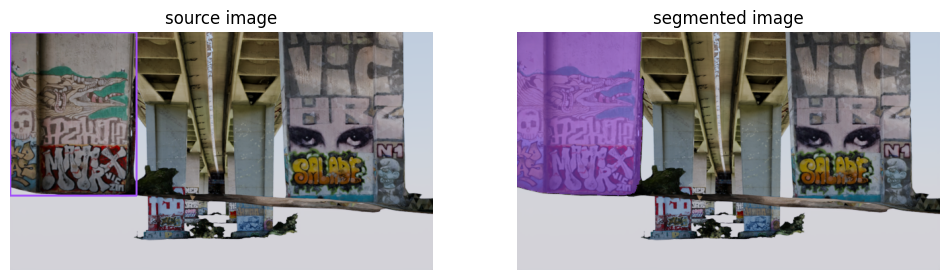

In [25]:
box_annotator = sv.BoxAnnotator(color_lookup=sv.ColorLookup.INDEX)
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

detections = sv.Detections(
    xyxy=sv.mask_to_xyxy(masks=masks),
    mask=masks.astype(bool)
)

source_image = box_annotator.annotate(scene=image_bgr.copy(), detections=detections)
segmented_image = mask_annotator.annotate(scene=image_bgr.copy(), detections=detections)

sv.plot_images_grid(
    images=[source_image, segmented_image],
    grid_size=(1, 2),
    titles=['source image', 'segmented image']
)

## Prompting with points

**NOTE:** Execute cell below and use your mouse to **draw points** on the image 👇

In [26]:
IS_COLAB = True

if IS_COLAB:
    from google.colab import output
    output.enable_custom_widget_manager()

from jupyter_bbox_widget import BBoxWidget

widget = BBoxWidget()
widget.image = encode_image(IMAGE_PATH)
widget

BBoxWidget(colors=['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#b…

In [27]:
widget.bboxes

[{'x': 259, 'y': 97, 'width': 0, 'height': 0, 'label': ''},
 {'x': 265, 'y': 77, 'width': 0, 'height': 0, 'label': ''},
 {'x': 266, 'y': 102, 'width': 0, 'height': 0, 'label': ''},
 {'x': 278, 'y': 133, 'width': 0, 'height': 0, 'label': ''},
 {'x': 285, 'y': 163, 'width': 0, 'height': 0, 'label': ''},
 {'x': 284, 'y': 178, 'width': 0, 'height': 0, 'label': ''},
 {'x': 253, 'y': 13, 'width': 0, 'height': 0, 'label': ''},
 {'x': 289, 'y': 184, 'width': 0, 'height': 0, 'label': ''}]

In [28]:
default_box = [
    {'x': 330, 'y': 450, 'width': 0, 'height': 0, 'label': ''},
    {'x': 191, 'y': 665, 'width': 0, 'height': 0, 'label': ''},
    {'x': 86, 'y': 879, 'width': 0, 'height': 0, 'label': ''},
    {'x': 425, 'y': 727, 'width': 0, 'height': 0, 'label': ''}
]

boxes = widget.bboxes if widget.bboxes else default_box
input_point = np.array([
    [
        box['x'],
        box['y']
    ] for box in boxes
])
input_label = np.ones(input_point.shape[0])

In [29]:
masks, scores, logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    multimask_output=True,
)

**NOTE:** With `multimask_output=True` (the default setting), SAM 2 outputs 3 masks, where scores gives the model's own estimation of the quality of these masks. This setting is intended for ambiguous input prompts, and helps the model disambiguate different objects consistent with the prompt. When False, it will return a single mask. For ambiguous prompts such as a single point, it is recommended to use `multimask_output=True` even if only a single mask is desired; the best single mask can be chosen by picking the one with the highest score returned in scores. This will often result in a better mask.

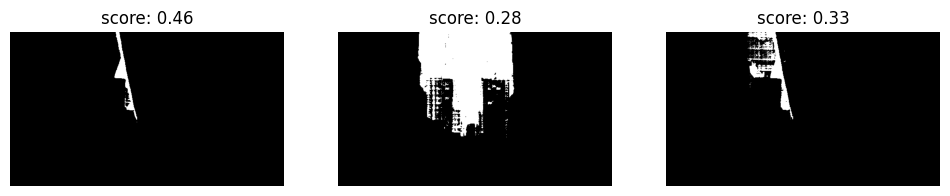

In [30]:
sv.plot_images_grid(
    images=masks,
    titles=[f"score: {score:.2f}" for score in scores],
    grid_size=(1, 3),
    size=(12, 12)
)

In [31]:
# Additional imports for multi-modal processing
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from scipy import ndimage
from scipy.ndimage import binary_erosion, binary_dilation
from skimage import filters, measure, morphology
from skimage.feature import canny
from skimage.segmentation import watershed
import glob
import os

In [33]:
# Data Loading Functions for Multi-Modal Bridge Images
def load_multimodal_bridge_data(base_path, frame_id="00001"):
    """
    Load RGB, depth, normal, and UV images for a given frame.

    Expected file structure:
    base_path/
    ├── rgb/rgb_{frame_id}.png
    ├── depth/depth_{frame_id}.exr (or .png)
    ├── normal/normal_{frame_id}.exr (or .png)
    └── uv/uv_{frame_id}.exr (or .png)
    """
    data = {}

    # RGB image
    rgb_path = os.path.join(base_path, f"rgb/rgb_{frame_id}.png")
    if os.path.exists(rgb_path):
        data['rgb'] = cv2.imread(rgb_path)
        data['rgb_original'] = cv2.cvtColor(data['rgb'], cv2.COLOR_BGR2RGB)
    else:
        print(f"Warning: RGB image not found at {rgb_path}")
        return None

    # Depth image
    depth_paths = [
        os.path.join(base_path, f"depth/depth_{frame_id}.exr"),
        os.path.join(base_path, f"depth/depth_{frame_id}.png"),
        os.path.join(base_path, f"depth_{frame_id}.exr"),
        os.path.join(base_path, f"depth_{frame_id}.png")
    ]

    for depth_path in depth_paths:
        if os.path.exists(depth_path):
            if depth_path.endswith('.exr'):
                try:
                    import OpenEXR
                    import Imath
                    exr_file = OpenEXR.InputFile(depth_path)
                    dw = exr_file.header()['dataWindow']
                    size = (dw.max.x - dw.min.x + 1, dw.max.y - dw.min.y + 1)
                    depth_str = exr_file.channel('R', Imath.PixelType(Imath.PixelType.FLOAT))
                    depth = np.frombuffer(depth_str, dtype=np.float32)
                    depth = depth.reshape(size[1], size[0])
                    data['depth'] = depth
                except ImportError:
                    print("OpenEXR not available, trying to load as regular image")
                    depth_img = cv2.imread(depth_path, cv2.IMREAD_ANYDEPTH)
                    data['depth'] = depth_img.astype(np.float32) if depth_img is not None else None
            else:
                depth_img = cv2.imread(depth_path, cv2.IMREAD_ANYDEPTH)
                data['depth'] = depth_img.astype(np.float32) if depth_img is not None else None
            break

    # Surface normal image
    normal_paths = [
        os.path.join(base_path, f"normal/normal_{frame_id}.exr"),
        os.path.join(base_path, f"normal/normal_{frame_id}.png"),
        os.path.join(base_path, f"normal_{frame_id}.exr"),
        os.path.join(base_path, f"normal_{frame_id}.png")
    ]

    for normal_path in normal_paths:
        if os.path.exists(normal_path):
            if normal_path.endswith('.exr'):
                try:
                    import OpenEXR
                    import Imath
                    exr_file = OpenEXR.InputFile(normal_path)
                    dw = exr_file.header()['dataWindow']
                    size = (dw.max.x - dw.min.x + 1, dw.max.y - dw.min.y + 1)

                    r_str = exr_file.channel('R', Imath.PixelType(Imath.PixelType.FLOAT))
                    g_str = exr_file.channel('G', Imath.PixelType(Imath.PixelType.FLOAT))
                    b_str = exr_file.channel('B', Imath.PixelType(Imath.PixelType.FLOAT))

                    r = np.frombuffer(r_str, dtype=np.float32).reshape(size[1], size[0])
                    g = np.frombuffer(g_str, dtype=np.float32).reshape(size[1], size[0])
                    b = np.frombuffer(b_str, dtype=np.float32).reshape(size[1], size[0])

                    data['normal'] = np.stack([r, g, b], axis=2)
                except ImportError:
                    normal_img = cv2.imread(normal_path, cv2.IMREAD_COLOR)
                    if normal_img is not None:
                        # Convert from BGR to RGB and normalize to [-1, 1]
                        normal_img = cv2.cvtColor(normal_img, cv2.COLOR_BGR2RGB)
                        data['normal'] = (normal_img.astype(np.float32) / 255.0) * 2.0 - 1.0
            else:
                normal_img = cv2.imread(normal_path, cv2.IMREAD_COLOR)
                if normal_img is not None:
                    normal_img = cv2.cvtColor(normal_img, cv2.COLOR_BGR2RGB)
                    data['normal'] = (normal_img.astype(np.float32) / 255.0) * 2.0 - 1.0
            break

    # UV coordinate image
    uv_paths = [
        os.path.join(base_path, f"uv/uv_{frame_id}.exr"),
        os.path.join(base_path, f"uv/uv_{frame_id}.png"),
        os.path.join(base_path, f"uv_{frame_id}.exr"),
        os.path.join(base_path, f"uv_{frame_id}.png")
    ]

    for uv_path in uv_paths:
        if os.path.exists(uv_path):
            if uv_path.endswith('.exr'):
                try:
                    import OpenEXR
                    import Imath
                    exr_file = OpenEXR.InputFile(uv_path)
                    dw = exr_file.header()['dataWindow']
                    size = (dw.max.x - dw.min.x + 1, dw.max.y - dw.min.y + 1)

                    u_str = exr_file.channel('R', Imath.PixelType(Imath.PixelType.FLOAT))
                    v_str = exr_file.channel('G', Imath.PixelType(Imath.PixelType.FLOAT))

                    u = np.frombuffer(u_str, dtype=np.float32).reshape(size[1], size[0])
                    v = np.frombuffer(v_str, dtype=np.float32).reshape(size[1], size[0])

                    data['uv'] = np.stack([u, v], axis=2)
                except ImportError:
                    uv_img = cv2.imread(uv_path, cv2.IMREAD_COLOR)
                    if uv_img is not None:
                        uv_img = cv2.cvtColor(uv_img, cv2.COLOR_BGR2RGB)
                        data['uv'] = uv_img.astype(np.float32)
            else:
                uv_img = cv2.imread(uv_path, cv2.IMREAD_COLOR)
                if uv_img is not None:
                    uv_img = cv2.cvtColor(uv_img, cv2.COLOR_BGR2RGB)
                    data['uv'] = uv_img.astype(np.float32)
            break

    return data

# Example usage - Update this path to your bridge data directory
BRIDGE_DATA_PATH = f"{HOME}/data_bridge"  # Update this path
FRAME_ID = "00001"  # Update this to your frame ID

# Try to load multimodal data
bridge_data = load_multimodal_bridge_data(BRIDGE_DATA_PATH, FRAME_ID)

if bridge_data is None:
    print("Could not load bridge data. Please update BRIDGE_DATA_PATH and ensure files exist.")
    print(f"Expected structure:")
    print(f"{BRIDGE_DATA_PATH}/rgb/rgb_{FRAME_ID}.png")
    print(f"{BRIDGE_DATA_PATH}/depth/depth_{FRAME_ID}.exr (or .png)")
    print(f"{BRIDGE_DATA_PATH}/normal/normal_{FRAME_ID}.exr (or .png)")
    print(f"{BRIDGE_DATA_PATH}/uv/uv_{FRAME_ID}.exr (or .png)")
else:
    print(f"Successfully loaded bridge data with channels: {list(bridge_data.keys())}")
    print(f"RGB shape: {bridge_data['rgb_original'].shape}")
    if 'depth' in bridge_data and bridge_data['depth'] is not None:
        print(f"Depth shape: {bridge_data['depth'].shape}")
    if 'normal' in bridge_data and bridge_data['normal'] is not None:
        print(f"Normal shape: {bridge_data['normal'].shape}")
    if 'uv' in bridge_data and bridge_data['uv'] is not None:
        print(f"UV shape: {bridge_data['uv'].shape}")

Successfully loaded bridge data with channels: ['rgb', 'rgb_original', 'depth', 'normal', 'uv']
RGB shape: (360, 640, 3)
Depth shape: (360, 640)
Normal shape: (360, 640, 3)
UV shape: (360, 640, 3)


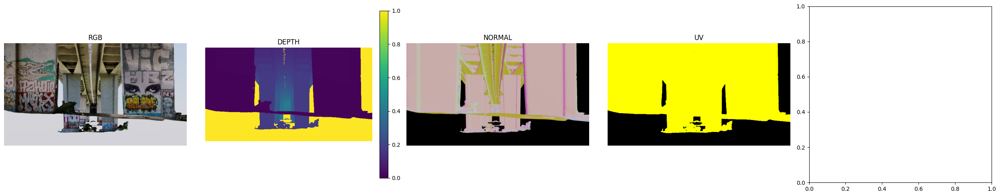

In [34]:
# Visualization Functions
def visualize_multimodal_data(bridge_data):
    """Visualize all available modalities"""
    available_channels = [k for k, v in bridge_data.items() if v is not None and k != 'rgb']
    n_channels = len(available_channels) + 1  # +1 for RGB

    fig, axes = plt.subplots(1, n_channels, figsize=(5 * n_channels, 5))
    if n_channels == 1:
        axes = [axes]

    # RGB
    axes[0].imshow(bridge_data['rgb_original'])
    axes[0].set_title('RGB')
    axes[0].axis('off')

    idx = 1
    for channel in available_channels:
        if channel == 'rgb_original':
            continue

        data = bridge_data[channel]

        if channel == 'depth':
            # Normalize depth for visualization
            depth_norm = (data - np.nanmin(data)) / (np.nanmax(data) - np.nanmin(data))
            im = axes[idx].imshow(depth_norm, cmap='viridis')
            plt.colorbar(im, ax=axes[idx], fraction=0.046, pad=0.04)

        elif channel == 'normal':
            # Normal maps: convert from [-1,1] to [0,1] for visualization
            normal_vis = (data + 1.0) / 2.0
            normal_vis = np.clip(normal_vis, 0, 1)
            axes[idx].imshow(normal_vis)

        elif channel == 'uv':
            # UV coordinates visualization
            if data.shape[2] >= 2:
                uv_vis = np.zeros((*data.shape[:2], 3))
                uv_vis[:, :, 0] = data[:, :, 0]  # U to red channel
                uv_vis[:, :, 1] = data[:, :, 1]  # V to green channel
                uv_vis = np.clip(uv_vis, 0, 1)
                axes[idx].imshow(uv_vis)
            else:
                axes[idx].imshow(data, cmap='jet')

        axes[idx].set_title(f'{channel.upper()}')
        axes[idx].axis('off')
        idx += 1

    plt.tight_layout()
    plt.show()

# Visualize the loaded data if available
if bridge_data is not None:
    visualize_multimodal_data(bridge_data)

Generated 33 depth-based point prompts
Generated 8 depth-based box prompts


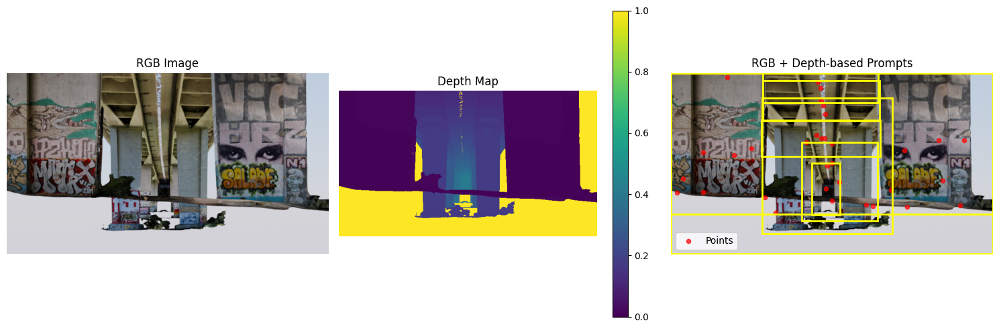

In [49]:
def generate_depth_based_prompts(depth_map, rgb_image, method='edges', n_prompts=50):
    """
    Generate prompts based on depth information

    Args:
        depth_map: 2D depth array
        rgb_image: RGB image for context
        method: 'edges', 'gradients', 'regions', or 'combined'
        n_prompts: number of prompts to generate

    Returns:
        dict with 'points', 'boxes', and 'labels'
    """
    prompts = {'points': [], 'boxes': [], 'labels': []}

    if depth_map is None:
        print("No depth data available, falling back to RGB-based prompts")
        return generate_rgb_based_prompts(rgb_image, n_prompts)

    # Handle NaN values in depth
    depth_clean = np.nan_to_num(depth_map, nan=np.nanmean(depth_map))

    if method in ['edges', 'combined']:
        # Find depth edges (structural boundaries)
        depth_edges = canny(depth_clean, sigma=2.0, low_threshold=0.1, high_threshold=0.3)

        # Find edge points
        edge_points = np.where(depth_edges)
        if len(edge_points[0]) > 0:
            # Sample points along edges
            n_edge_points = min(n_prompts // 2, len(edge_points[0]))
            indices = np.random.choice(len(edge_points[0]), n_edge_points, replace=False)

            for idx in indices:
                y, x = edge_points[0][idx], edge_points[1][idx]
                prompts['points'].append([x, y])
                prompts['labels'].append(1)  # foreground

    if method in ['gradients', 'combined']:
        # Find areas with high depth gradients
        grad_y, grad_x = np.gradient(depth_clean)
        gradient_magnitude = np.sqrt(grad_x**2 + grad_y**2)

        # Threshold to find significant gradients
        grad_threshold = np.percentile(gradient_magnitude, 85)
        high_grad_regions = gradient_magnitude > grad_threshold

        grad_points = np.where(high_grad_regions)
        if len(grad_points[0]) > 0:
            n_grad_points = min(n_prompts // 3, len(grad_points[0]))
            indices = np.random.choice(len(grad_points[0]), n_grad_points, replace=False)

            for idx in indices:
                y, x = grad_points[0][idx], grad_points[1][idx]
                prompts['points'].append([x, y])
                prompts['labels'].append(1)

    if method in ['regions', 'combined']:
        # Find distinct depth regions using clustering
        h, w = depth_clean.shape
        depth_values = depth_clean.reshape(-1, 1)

        # Use KMeans to find depth clusters (potential structural elements)
        n_clusters = min(8, len(np.unique(depth_clean)))
        if n_clusters > 1:
            kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
            depth_labels = kmeans.fit_predict(depth_values)
            depth_segmented = depth_labels.reshape(h, w)

            # Generate bounding boxes for each region
            for label in range(n_clusters):
                region_mask = (depth_segmented == label)

                # Filter small regions
                region_area = np.sum(region_mask)
                if region_area < (h * w * 0.01):  # At least 1% of image
                    continue

                # Find bounding box
                coords = np.where(region_mask)
                if len(coords[0]) > 0:
                    y_min, y_max = np.min(coords[0]), np.max(coords[0])
                    x_min, x_max = np.min(coords[1]), np.max(coords[1])

                    # Add some padding
                    padding = 5
                    x_min = max(0, x_min - padding)
                    y_min = max(0, y_min - padding)
                    x_max = min(w - 1, x_max + padding)
                    y_max = min(h - 1, y_max + padding)

                    prompts['boxes'].append([x_min, y_min, x_max, y_max])

                    # Also add center point
                    center_x = (x_min + x_max) // 2
                    center_y = (y_min + y_max) // 2
                    prompts['points'].append([center_x, center_y])
                    prompts['labels'].append(1)

    # Fill remaining prompts with random points if needed
    current_points = len(prompts['points'])
    if current_points < n_prompts:
        remaining = n_prompts - current_points
        for _ in range(remaining):
            x = np.random.randint(0, depth_clean.shape[1])
            y = np.random.randint(0, depth_clean.shape[0])
            prompts['points'].append([x, y])
            prompts['labels'].append(1)

    # Convert to numpy arrays
    if prompts['points']:
        prompts['points'] = np.array(prompts['points'])
        prompts['labels'] = np.array(prompts['labels'])
    if prompts['boxes']:
        prompts['boxes'] = np.array(prompts['boxes'])

    return prompts

def generate_rgb_based_prompts(rgb_image, n_prompts=50):
    """Fallback function for RGB-based prompts"""
    h, w = rgb_image.shape[:2]
    points = []
    labels = []

    # Generate random points
    for _ in range(n_prompts):
        x = np.random.randint(0, w)
        y = np.random.randint(0, h)
        points.append([x, y])
        labels.append(1)

    return {
        'points': np.array(points),
        'labels': np.array(labels),
        'boxes': np.array([])
    }

# Test depth-based prompt generation
if bridge_data is not None and 'depth' in bridge_data and bridge_data['depth'] is not None:
    depth_prompts = generate_depth_based_prompts(
        bridge_data['depth'],
        bridge_data['rgb_original'],
        method='combined',
        n_prompts=30
    )

    print(f"Generated {len(depth_prompts['points'])} depth-based point prompts")
    print(f"Generated {len(depth_prompts['boxes'])} depth-based box prompts")

    # Visualize the prompts
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    # Original RGB
    axes[0].imshow(bridge_data['rgb_original'])
    axes[0].set_title('RGB Image')
    axes[0].axis('off')

    # Depth map
    depth_norm = (bridge_data['depth'] - np.nanmin(bridge_data['depth'])) / (np.nanmax(bridge_data['depth']) - np.nanmin(bridge_data['depth']))
    im = axes[1].imshow(depth_norm, cmap='viridis')
    axes[1].set_title('Depth Map')
    axes[1].axis('off')
    plt.colorbar(im, ax=axes[1])

    # RGB with prompts overlaid
    axes[2].imshow(bridge_data['rgb_original'])

    # Plot point prompts
    if len(depth_prompts['points']) > 0:
        axes[2].scatter(depth_prompts['points'][:, 0], depth_prompts['points'][:, 1],
                       c='red', s=20, alpha=0.7, label='Points')

    # Plot box prompts
    if len(depth_prompts['boxes']) > 0:
        for box in depth_prompts['boxes']:
            rect = plt.Rectangle((box[0], box[1]), box[2]-box[0], box[3]-box[1],
                               fill=False, color='yellow', linewidth=2)
            axes[2].add_patch(rect)

    axes[2].set_title('RGB + Depth-based Prompts')
    axes[2].axis('off')
    axes[2].legend()

    plt.tight_layout()
    plt.show()
else:
    print("No depth data available for prompt generation")

Generated 30 normal-based prompts


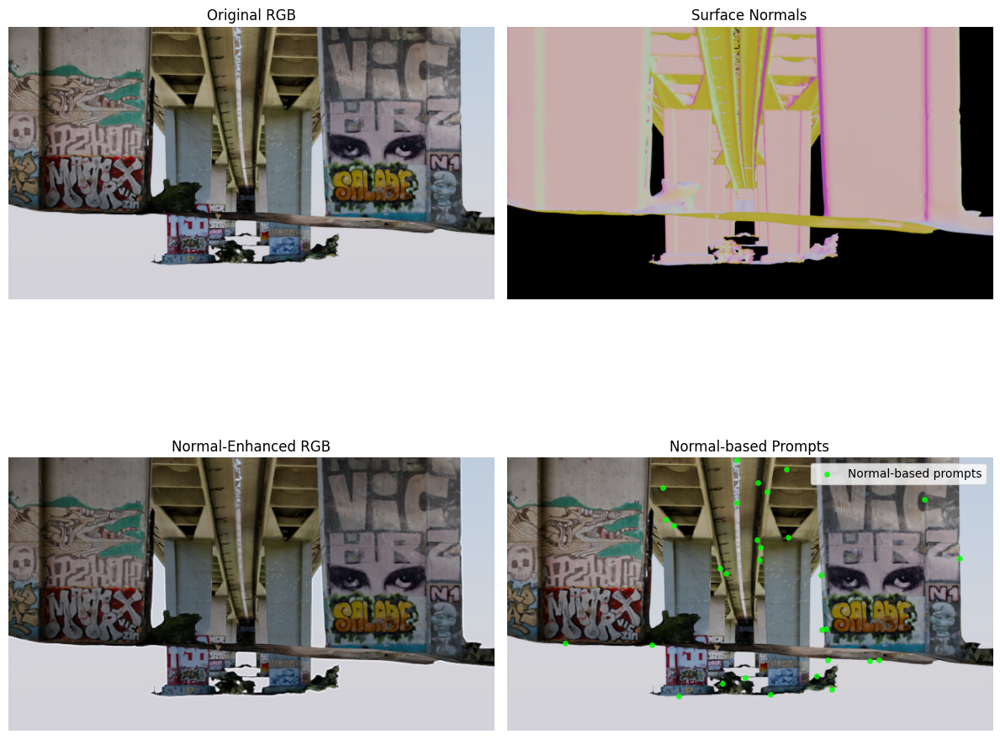

In [51]:
def enhance_rgb_with_normals(rgb_image, normal_map, method='edge_enhancement'):
    """
    Enhance RGB image using surface normal information

    Args:
        rgb_image: RGB image (H, W, 3)
        normal_map: Surface normal map (H, W, 3) with values in [-1, 1]
        method: 'edge_enhancement', 'normal_magnitude', or 'combined'

    Returns:
        Enhanced RGB image
    """
    if normal_map is None:
        return rgb_image

    enhanced_rgb = rgb_image.copy().astype(np.float32)

    if method in ['edge_enhancement', 'combined']:
        # Calculate normal discontinuities (edges between different surface orientations)
        normal_dx = np.gradient(normal_map, axis=1)
        normal_dy = np.gradient(normal_map, axis=0)

        # Magnitude of normal changes
        normal_edge_mag = np.sqrt(np.sum(normal_dx**2 + normal_dy**2, axis=2))

        # Normalize and enhance edges
        normal_edge_mag = (normal_edge_mag - normal_edge_mag.min()) / (normal_edge_mag.max() - normal_edge_mag.min() + 1e-8)

        # Enhance RGB edges where normal edges are strong
        for c in range(3):
            enhanced_rgb[:, :, c] = enhanced_rgb[:, :, c] * (1 + normal_edge_mag * 0.3)

    if method in ['normal_magnitude', 'combined']:
        # Use normal magnitude as a feature
        normal_magnitude = np.sqrt(np.sum(normal_map**2, axis=2))
        normal_magnitude = (normal_magnitude - normal_magnitude.min()) / (normal_magnitude.max() - normal_magnitude.min() + 1e-8)

        # Modulate RGB intensity based on normal magnitude
        for c in range(3):
            enhanced_rgb[:, :, c] = enhanced_rgb[:, :, c] * (0.7 + normal_magnitude * 0.3)

    return np.clip(enhanced_rgb, 0, 255).astype(np.uint8)

def generate_normal_based_prompts(normal_map, rgb_image, n_prompts=50):
    """
    Generate prompts based on surface normal discontinuities
    """
    prompts = {'points': [], 'labels': []}

    if normal_map is None:
        return generate_rgb_based_prompts(rgb_image, n_prompts)

    # Calculate normal magnitude and discontinuities
    normal_magnitude = np.sqrt(np.sum(normal_map**2, axis=2))

    # Find areas with sharp normal changes (surface boundaries)
    normal_dx = np.gradient(normal_map, axis=1)
    normal_dy = np.gradient(normal_map, axis=0)
    normal_edge_mag = np.sqrt(np.sum(normal_dx**2 + normal_dy**2, axis=2))

    # Threshold to find significant normal changes
    edge_threshold = np.percentile(normal_edge_mag, 90)
    edge_regions = normal_edge_mag > edge_threshold

    # Find edge points
    edge_points = np.where(edge_regions)
    if len(edge_points[0]) > 0:
        n_edge_points = min(n_prompts, len(edge_points[0]))
        indices = np.random.choice(len(edge_points[0]), n_edge_points, replace=False)

        for idx in indices:
            y, x = edge_points[0][idx], edge_points[1][idx]
            prompts['points'].append([x, y])
            prompts['labels'].append(1)

    # Fill remaining with random points if needed
    current_points = len(prompts['points'])
    if current_points < n_prompts:
        h, w = normal_map.shape[:2]
        remaining = n_prompts - current_points
        for _ in range(remaining):
            x = np.random.randint(0, w)
            y = np.random.randint(0, h)
            prompts['points'].append([x, y])
            prompts['labels'].append(1)

    if prompts['points']:
        prompts['points'] = np.array(prompts['points'])
        prompts['labels'] = np.array(prompts['labels'])

    return prompts

# Test normal-based enhancement
if bridge_data is not None and 'normal' in bridge_data and bridge_data['normal'] is not None:
    # Enhance RGB with normal information
    enhanced_rgb = enhance_rgb_with_normals(
        bridge_data['rgb_original'],
        bridge_data['normal'],
        method='combined'
    )

    # Generate normal-based prompts
    normal_prompts = generate_normal_based_prompts(
        bridge_data['normal'],
        bridge_data['rgb_original'],
        n_prompts=30
    )

    print(f"Generated {len(normal_prompts['points'])} normal-based prompts")

    # Visualize
    fig, axes = plt.subplots(2, 2, figsize=(12, 12))

    # Original RGB
    axes[0, 0].imshow(bridge_data['rgb_original'])
    axes[0, 0].set_title('Original RGB')
    axes[0, 0].axis('off')

    # Normal map visualization
    normal_vis = (bridge_data['normal'] + 1.0) / 2.0
    normal_vis = np.clip(normal_vis, 0, 1)
    axes[0, 1].imshow(normal_vis)
    axes[0, 1].set_title('Surface Normals')
    axes[0, 1].axis('off')

    # Enhanced RGB
    axes[1, 0].imshow(enhanced_rgb)
    axes[1, 0].set_title('Normal-Enhanced RGB')
    axes[1, 0].axis('off')

    # RGB with normal-based prompts
    axes[1, 1].imshow(bridge_data['rgb_original'])
    if len(normal_prompts['points']) > 0:
        axes[1, 1].scatter(normal_prompts['points'][:, 0], normal_prompts['points'][:, 1],
                          c='lime', s=15, alpha=0.8, label='Normal-based prompts')
    axes[1, 1].set_title('Normal-based Prompts')
    axes[1, 1].axis('off')
    axes[1, 1].legend()

    plt.tight_layout()
    plt.show()
else:
    print("No normal data available for enhancement")

=== Strategy 1: Depth-Guided Segmentation ===
Generated 20 depth-guided prompts


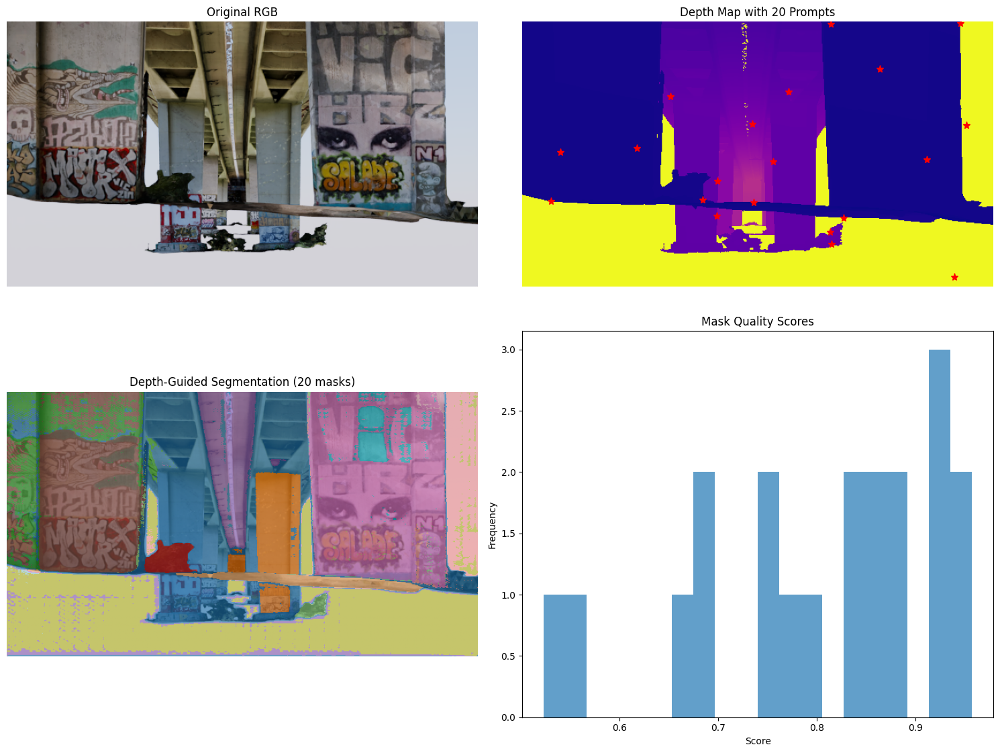

Strategy 1 generated 20 masks


In [52]:
def generate_depth_guided_prompts(depth_map, n_prompts=20, depth_threshold=0.1):
    """
    Generate prompts based on depth discontinuities and depth regions

    Args:
        depth_map (np.ndarray): Depth map
        n_prompts (int): Number of prompts to generate
        depth_threshold (float): Threshold for depth edge detection

    Returns:
        list: List of (x, y) prompt coordinates
    """
    h, w = depth_map.shape

    # Normalize depth map
    depth_norm = (depth_map - depth_map.min()) / (depth_map.max() - depth_map.min() + 1e-8)

    # Find depth edges using Sobel operators
    grad_x = cv2.Sobel(depth_norm, cv2.CV_64F, 1, 0, ksize=3)
    grad_y = cv2.Sobel(depth_norm, cv2.CV_64F, 0, 1, ksize=3)
    depth_edges = np.sqrt(grad_x**2 + grad_y**2)

    # Threshold depth edges
    edge_mask = depth_edges > depth_threshold

    # Find edge pixels
    edge_points = np.column_stack(np.where(edge_mask))

    prompts = []

    if len(edge_points) > 0:
        # Sample from edge points
        n_edge_prompts = min(n_prompts // 2, len(edge_points))
        edge_indices = np.random.choice(len(edge_points), n_edge_prompts, replace=False)
        edge_prompts = edge_points[edge_indices]

        # Convert from (row, col) to (x, y)
        for point in edge_prompts:
            prompts.append((point[1], point[0]))

    # Generate depth-based region prompts
    remaining_prompts = n_prompts - len(prompts)

    # Divide depth into regions and sample from each
    depth_percentiles = np.percentile(depth_norm[depth_norm > 0], [25, 50, 75])

    for i, percentile in enumerate(depth_percentiles):
        if remaining_prompts <= 0:
            break

        # Find pixels in this depth range
        if i == 0:
            mask = depth_norm <= percentile
        elif i == len(depth_percentiles) - 1:
            mask = depth_norm > depth_percentiles[i-1]
        else:
            mask = (depth_norm > depth_percentiles[i-1]) & (depth_norm <= percentile)

        region_points = np.column_stack(np.where(mask))

        if len(region_points) > 0:
            n_region_prompts = min(remaining_prompts // (len(depth_percentiles) - i), len(region_points))
            if n_region_prompts > 0:
                region_indices = np.random.choice(len(region_points), n_region_prompts, replace=False)
                region_prompts = region_points[region_indices]

                for point in region_prompts:
                    prompts.append((point[1], point[0]))
                    remaining_prompts -= 1

    return prompts

def depth_guided_segmentation(data, predictor, n_prompts=20):
    """
    Perform SAM segmentation using depth-guided prompts
    """
    rgb_image = data['rgb_original']
    depth_map = data['depth']

    # Set the image for SAM
    predictor.set_image(rgb_image)

    # Generate depth-guided prompts
    prompts = generate_depth_guided_prompts(depth_map, n_prompts)

    print(f"Generated {len(prompts)} depth-guided prompts")

    # Run SAM prediction for each prompt
    masks = []
    scores = []

    for i, (x, y) in enumerate(prompts):
        input_point = np.array([[x, y]])
        input_label = np.array([1])

        try:
            mask, score, _ = predictor.predict(
                point_coords=input_point,
                point_labels=input_label,
                multimask_output=False
            )

            if len(mask) > 0:
                masks.append(mask[0])
                scores.append(score[0])

        except Exception as e:
            print(f"Error processing prompt {i}: {e}")
            continue

    # Visualize results
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))

    # Original RGB
    axes[0, 0].imshow(rgb_image)
    axes[0, 0].set_title('Original RGB')
    axes[0, 0].axis('off')

    # Depth map with prompts
    axes[0, 1].imshow(depth_map, cmap='plasma')
    for x, y in prompts:
        axes[0, 1].plot(x, y, 'r*', markersize=8)
    axes[0, 1].set_title(f'Depth Map with {len(prompts)} Prompts')
    axes[0, 1].axis('off')

    # Combined masks overlay
    if masks:
        combined_mask = np.zeros_like(masks[0], dtype=float)
        for i, mask in enumerate(masks):
            combined_mask += mask * (i + 1)

        axes[1, 0].imshow(rgb_image)
        axes[1, 0].imshow(combined_mask, alpha=0.6, cmap='tab20')
        axes[1, 0].set_title(f'Depth-Guided Segmentation ({len(masks)} masks)')
        axes[1, 0].axis('off')

        # Mask quality histogram
        axes[1, 1].hist(scores, bins=20, alpha=0.7)
        axes[1, 1].set_title('Mask Quality Scores')
        axes[1, 1].set_xlabel('Score')
        axes[1, 1].set_ylabel('Frequency')

    plt.tight_layout()
    plt.show()

    return {
        'masks': masks,
        'scores': scores,
        'prompts': prompts,
        'method': 'depth_guided'
    }

# Test Strategy 1 if bridge data is available
if bridge_data is not None:
    print("=== Strategy 1: Depth-Guided Segmentation ===")
    depth_results = depth_guided_segmentation(bridge_data, predictor)
    print(f"Strategy 1 generated {len(depth_results['masks'])} masks")

=== Strategy 2: Normal-Enhanced Segmentation ===
Generated 20 normal-based prompts


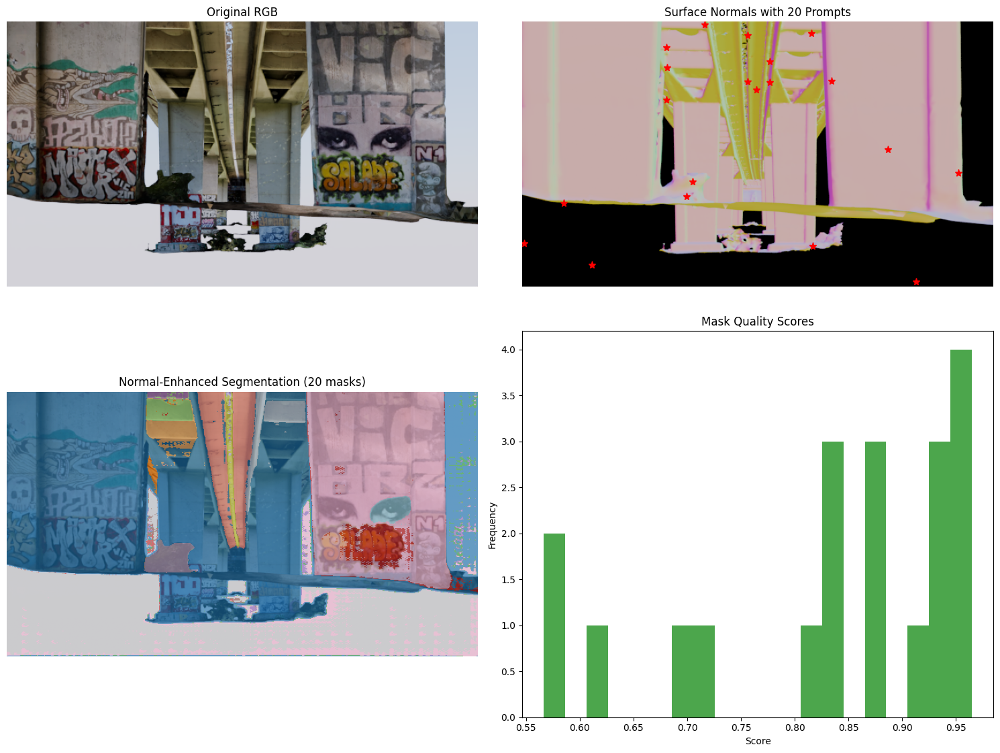

Strategy 2 generated 20 masks


In [53]:
def generate_normal_based_prompts(normal_map, rgb_image, n_prompts=20, normal_threshold=0.3):
    """
    Generate prompts based on surface normal discontinuities

    Args:
        normal_map (np.ndarray): Surface normal map (H, W, 3)
        rgb_image (np.ndarray): RGB image for context
        n_prompts (int): Number of prompts to generate
        normal_threshold (float): Threshold for normal discontinuity detection

    Returns:
        list: List of (x, y) prompt coordinates
    """
    h, w = normal_map.shape[:2]

    # Calculate normal magnitude changes (discontinuities)
    normal_magnitude = np.linalg.norm(normal_map, axis=2)

    # Calculate gradients of normal components
    grad_nx = cv2.Sobel(normal_map[:, :, 0], cv2.CV_64F, 1, 0, ksize=3)
    grad_ny = cv2.Sobel(normal_map[:, :, 1], cv2.CV_64F, 0, 1, ksize=3)
    grad_nz_x = cv2.Sobel(normal_map[:, :, 2], cv2.CV_64F, 1, 0, ksize=3)
    grad_nz_y = cv2.Sobel(normal_map[:, :, 2], cv2.CV_64F, 0, 1, ksize=3)

    # Combined normal discontinuity
    normal_discontinuity = np.sqrt(grad_nx**2 + grad_ny**2 + grad_nz_x**2 + grad_nz_y**2)

    # Threshold normal discontinuities
    discontinuity_mask = normal_discontinuity > normal_threshold

    # Find discontinuity points
    discontinuity_points = np.column_stack(np.where(discontinuity_mask))

    prompts = []

    if len(discontinuity_points) > 0:
        # Sample from discontinuity points
        n_discontinuity_prompts = min(n_prompts // 2, len(discontinuity_points))
        disc_indices = np.random.choice(len(discontinuity_points), n_discontinuity_prompts, replace=False)
        disc_prompts = discontinuity_points[disc_indices]

        # Convert from (row, col) to (x, y)
        for point in disc_prompts:
            prompts.append((point[1], point[0]))

    # Generate prompts from surface orientation clusters
    remaining_prompts = n_prompts - len(prompts)

    # Cluster normals by orientation (simplified approach)
    # Focus on major orientations: vertical, horizontal, diagonal
    normal_z = normal_map[:, :, 2]  # Z component (pointing up/down)

    # Find different surface orientations
    vertical_mask = np.abs(normal_z) > 0.7  # Nearly vertical surfaces
    horizontal_mask = np.abs(normal_z) < 0.3  # Nearly horizontal surfaces
    diagonal_mask = ~(vertical_mask | horizontal_mask)  # Diagonal surfaces

    orientation_masks = [vertical_mask, horizontal_mask, diagonal_mask]
    orientation_names = ['vertical', 'horizontal', 'diagonal']

    for i, (mask, name) in enumerate(zip(orientation_masks, orientation_names)):
        if remaining_prompts <= 0:
            break

        orientation_points = np.column_stack(np.where(mask))

        if len(orientation_points) > 0:
            n_orientation_prompts = min(remaining_prompts // (len(orientation_masks) - i), len(orientation_points))
            if n_orientation_prompts > 0:
                orientation_indices = np.random.choice(len(orientation_points), n_orientation_prompts, replace=False)
                orientation_prompts = orientation_points[orientation_indices]

                for point in orientation_prompts:
                    prompts.append((point[1], point[0]))
                    remaining_prompts -= 1

    return prompts

def normal_enhanced_segmentation(data, predictor, n_prompts=20):
    """
    Perform SAM segmentation using normal-enhanced prompts
    """
    rgb_image = data['rgb_original']
    normal_map = data['normal']

    # Set the image for SAM
    predictor.set_image(rgb_image)

    # Generate normal-based prompts
    prompts = generate_normal_based_prompts(normal_map, rgb_image, n_prompts)

    print(f"Generated {len(prompts)} normal-based prompts")

    # Run SAM prediction for each prompt
    masks = []
    scores = []

    for i, (x, y) in enumerate(prompts):
        input_point = np.array([[x, y]])
        input_label = np.array([1])

        try:
            mask, score, _ = predictor.predict(
                point_coords=input_point,
                point_labels=input_label,
                multimask_output=False
            )

            if len(mask) > 0:
                masks.append(mask[0])
                scores.append(score[0])

        except Exception as e:
            print(f"Error processing prompt {i}: {e}")
            continue

    # Visualize results
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))

    # Original RGB
    axes[0, 0].imshow(rgb_image)
    axes[0, 0].set_title('Original RGB')
    axes[0, 0].axis('off')

    # Normal map with prompts
    normal_vis = (normal_map + 1.0) / 2.0  # Convert to [0, 1] for visualization
    normal_vis = np.clip(normal_vis, 0, 1)
    axes[0, 1].imshow(normal_vis)
    for x, y in prompts:
        axes[0, 1].plot(x, y, 'r*', markersize=8)
    axes[0, 1].set_title(f'Surface Normals with {len(prompts)} Prompts')
    axes[0, 1].axis('off')

    # Combined masks overlay
    if masks:
        combined_mask = np.zeros_like(masks[0], dtype=float)
        for i, mask in enumerate(masks):
            combined_mask += mask * (i + 1)

        axes[1, 0].imshow(rgb_image)
        axes[1, 0].imshow(combined_mask, alpha=0.6, cmap='tab20')
        axes[1, 0].set_title(f'Normal-Enhanced Segmentation ({len(masks)} masks)')
        axes[1, 0].axis('off')

        # Mask quality histogram
        axes[1, 1].hist(scores, bins=20, alpha=0.7, color='green')
        axes[1, 1].set_title('Mask Quality Scores')
        axes[1, 1].set_xlabel('Score')
        axes[1, 1].set_ylabel('Frequency')

    plt.tight_layout()
    plt.show()

    return {
        'masks': masks,
        'scores': scores,
        'prompts': prompts,
        'method': 'normal_enhanced'
    }

# Test Strategy 2 if bridge data is available
if bridge_data is not None:
    print("=== Strategy 2: Normal-Enhanced Segmentation ===")
    normal_results = normal_enhanced_segmentation(bridge_data, predictor)
    print(f"Strategy 2 generated {len(normal_results['masks'])} masks")

=== Strategy 3: Multi-Modal Combined Segmentation ===
Classified 10 bridge elements: {'unknown', 'beam'}
Strategy 3 generated 10 masks

=== Comparing All Strategies ===


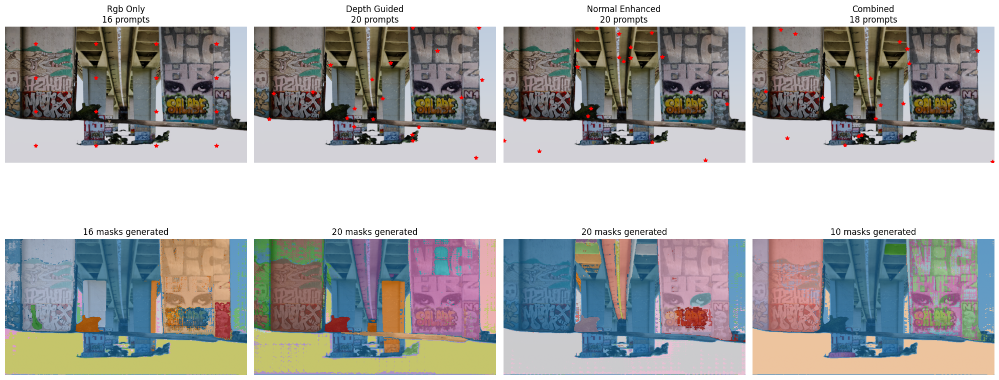

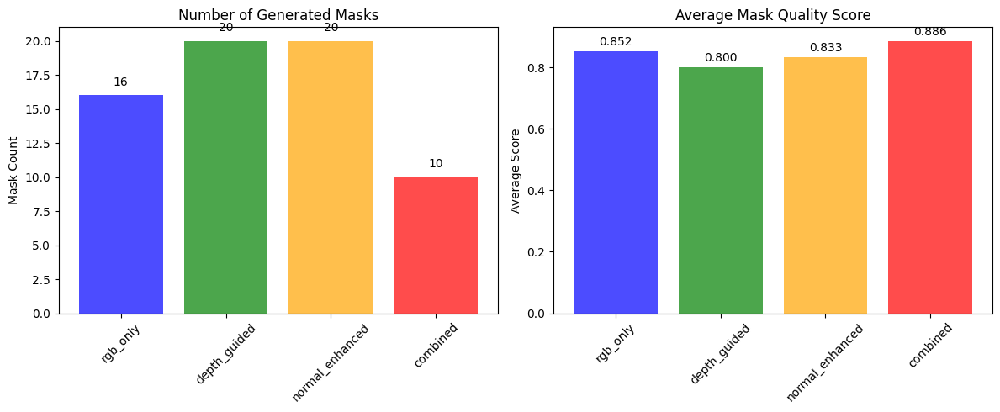


=== Segmentation Quality Comparison ===
Rgb Only:
  - Masks generated: 16
  - Average score: 0.852
  - Score std: 0.102
Depth Guided:
  - Masks generated: 20
  - Average score: 0.800
  - Score std: 0.121
Normal Enhanced:
  - Masks generated: 20
  - Average score: 0.833
  - Score std: 0.126
Combined:
  - Masks generated: 10
  - Average score: 0.886
  - Score std: 0.090


In [56]:
def multimodal_sam_segmentation(data, predictor, method='combined', n_prompts=20):
    """
    Unified multimodal SAM segmentation function

    Args:
        data (dict): Dictionary containing RGB, depth, normal, UV data
        predictor: SAM predictor object
        method (str): Segmentation method ('rgb_only', 'depth_guided', 'normal_enhanced', 'combined')
        n_prompts (int): Number of prompts to generate

    Returns:
        dict: Segmentation results
    """
    rgb_image = data['rgb_original']
    predictor.set_image(rgb_image)

    if method == 'rgb_only':
        # Standard SAM with grid prompts
        h, w = rgb_image.shape[:2]
        prompts = []
        grid_size = int(np.sqrt(n_prompts))
        for i in range(grid_size):
            for j in range(grid_size):
                x = int((j + 0.5) * w / grid_size)
                y = int((i + 0.5) * h / grid_size)
                prompts.append((x, y))

    elif method == 'depth_guided':
        prompts = generate_depth_guided_prompts(data['depth'], n_prompts)

    elif method == 'normal_enhanced':
        prompts = generate_normal_based_prompts(data['normal'], rgb_image, n_prompts)

    elif method == 'combined':
        # Combine prompts from all modalities
        depth_prompts = generate_depth_guided_prompts(data['depth'], n_prompts // 3)
        normal_prompts = generate_normal_based_prompts(data['normal'], rgb_image, n_prompts // 3)

        # Add UV-based prompts (texture boundary detection)
        uv_prompts = []
        if 'uv' in data and data['uv'] is not None:
            # Find UV discontinuities
            uv_map = data['uv']
            if len(uv_map.shape) == 3 and uv_map.shape[2] >= 2:
                grad_u = cv2.Sobel(uv_map[:, :, 0], cv2.CV_64F, 1, 0, ksize=3)
                grad_v = cv2.Sobel(uv_map[:, :, 1], cv2.CV_64F, 0, 1, ksize=3)
                uv_discontinuity = np.sqrt(grad_u**2 + grad_v**2)

                uv_threshold = np.percentile(uv_discontinuity, 90)
                uv_mask = uv_discontinuity > uv_threshold
                uv_points = np.column_stack(np.where(uv_mask))

                if len(uv_points) > 0:
                    n_uv_prompts = min(n_prompts // 3, len(uv_points))
                    uv_indices = np.random.choice(len(uv_points), n_uv_prompts, replace=False)
                    uv_selected = uv_points[uv_indices]

                    for point in uv_selected:
                        uv_prompts.append((point[1], point[0]))

        prompts = depth_prompts + normal_prompts + uv_prompts

    # Run SAM prediction for each prompt
    masks = []
    scores = []

    for i, (x, y) in enumerate(prompts):
        input_point = np.array([[x, y]])
        input_label = np.array([1])

        try:
            mask, score, _ = predictor.predict(
                point_coords=input_point,
                point_labels=input_label,
                multimask_output=False
            )

            if len(mask) > 0:
                masks.append(mask[0])
                scores.append(score[0])

        except Exception as e:
            print(f"Error processing prompt {i}: {e}")
            continue

    # Post-process masks for bridge-specific elements
    if method in ['combined', 'depth_guided']:
        masks, scores = classify_bridge_elements(masks, scores, data)

    return {
        'masks': masks,
        'scores': scores,
        'prompts': prompts,
        'method': method
    }

def classify_bridge_elements(masks, scores, data):
    """
    Classify and filter masks based on bridge-specific heuristics
    """
    if not masks:
        return masks, scores

    depth_map = data['depth']
    h, w = depth_map.shape

    # Bridge element classification heuristics
    classified_masks = []
    classified_scores = []
    element_types = []

    for mask, score in zip(masks, scores):
        # Calculate mask properties
        mask_bool = mask.astype(bool)  # Ensure mask is boolean
        mask_area = np.sum(mask_bool)
        mask_ratio = mask_area / (h * w)

        # Get mask bounding box
        mask_coords = np.where(mask_bool)
        if len(mask_coords[0]) == 0:
            continue

        min_y, max_y = np.min(mask_coords[0]), np.max(mask_coords[0])
        min_x, max_x = np.min(mask_coords[1]), np.max(mask_coords[1])

        mask_height = max_y - min_y
        mask_width = max_x - min_x
        aspect_ratio = mask_height / (mask_width + 1e-8)

        # Calculate average depth in mask
        mask_depth = depth_map[mask_bool]
        avg_depth = np.mean(mask_depth) if len(mask_depth) > 0 else 0

        # Classify based on heuristics
        element_type = "unknown"

        # Columns: tall, narrow, relatively consistent depth
        if aspect_ratio > 2.0 and mask_ratio > 0.01:
            element_type = "column"

        # Deck: wide, horizontal, specific depth range
        elif aspect_ratio < 0.5 and mask_ratio > 0.05 and min_y < h * 0.6:
            element_type = "deck"

        # Beams: horizontal or diagonal, medium size
        elif 0.3 < aspect_ratio < 1.5 and mask_ratio > 0.005:
            element_type = "beam"

        # Foundation: lower part of image, large area
        elif min_y > h * 0.7 and mask_ratio > 0.02:
            element_type = "foundation"

        # Only keep masks that correspond to likely bridge elements
        if element_type != "unknown" or score > 0.8:
            classified_masks.append(mask)
            classified_scores.append(score)
            element_types.append(element_type)

    print(f"Classified {len(classified_masks)} bridge elements: {set(element_types)}")

    return classified_masks, classified_scores

def visualize_multimodal_results(data, results_dict):
    """
    Visualize and compare results from different multimodal strategies
    """
    n_methods = len(results_dict)
    fig, axes = plt.subplots(2, n_methods, figsize=(5 * n_methods, 10))

    if n_methods == 1:
        axes = axes.reshape(2, 1)

    rgb_image = data['rgb_original']

    for i, (method, result) in enumerate(results_dict.items()):
        masks = result['masks']
        prompts = result['prompts']

        # Top row: RGB with prompts
        axes[0, i].imshow(rgb_image)
        for x, y in prompts:
            axes[0, i].plot(x, y, 'r*', markersize=6)
        axes[0, i].set_title(f'{method.replace("_", " ").title()}\n{len(prompts)} prompts')
        axes[0, i].axis('off')

        # Bottom row: RGB with mask overlay
        axes[1, i].imshow(rgb_image)
        if masks:
            combined_mask = np.zeros_like(masks[0], dtype=float)
            for j, mask in enumerate(masks):
                combined_mask += mask * (j + 1)
            axes[1, i].imshow(combined_mask, alpha=0.6, cmap='tab20')

        axes[1, i].set_title(f'{len(masks)} masks generated')
        axes[1, i].axis('off')

    plt.tight_layout()
    plt.show()

def compare_segmentation_quality(results_dict):
    """
    Compare segmentation quality across different methods
    """
    methods = list(results_dict.keys())
    mask_counts = [len(results_dict[method]['masks']) for method in methods]
    avg_scores = [np.mean(results_dict[method]['scores']) if results_dict[method]['scores'] else 0
                  for method in methods]

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

    # Mask count comparison
    bars1 = ax1.bar(methods, mask_counts, alpha=0.7, color=['blue', 'green', 'orange', 'red'][:len(methods)])
    ax1.set_title('Number of Generated Masks')
    ax1.set_ylabel('Mask Count')
    ax1.tick_params(axis='x', rotation=45)

    for bar, count in zip(bars1, mask_counts):
        ax1.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.5,
                str(count), ha='center', va='bottom')

    # Average score comparison
    bars2 = ax2.bar(methods, avg_scores, alpha=0.7, color=['blue', 'green', 'orange', 'red'][:len(methods)])
    ax2.set_title('Average Mask Quality Score')
    ax2.set_ylabel('Average Score')
    ax2.tick_params(axis='x', rotation=45)

    for bar, score in zip(bars2, avg_scores):
        ax2.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01,
                f'{score:.3f}', ha='center', va='bottom')

    plt.tight_layout()
    plt.show()

    # Print summary
    print("\n=== Segmentation Quality Comparison ===")
    for method in methods:
        masks = results_dict[method]['masks']
        scores = results_dict[method]['scores']
        print(f"{method.replace('_', ' ').title()}:")
        print(f"  - Masks generated: {len(masks)}")
        print(f"  - Average score: {np.mean(scores):.3f}" if scores else "  - Average score: N/A")
        print(f"  - Score std: {np.std(scores):.3f}" if scores else "  - Score std: N/A")

# Test Strategy 3 if bridge data is available
if bridge_data is not None:
    print("=== Strategy 3: Multi-Modal Combined Segmentation ===")
    combined_results = multimodal_sam_segmentation(bridge_data, predictor, method='combined')
    print(f"Strategy 3 generated {len(combined_results['masks'])} masks")

    # Compare all strategies
    all_results = {}
    all_results['rgb_only'] = multimodal_sam_segmentation(bridge_data, predictor, method='rgb_only')
    all_results['depth_guided'] = depth_results if 'depth_results' in locals() else multimodal_sam_segmentation(bridge_data, predictor, method='depth_guided')
    all_results['normal_enhanced'] = normal_results if 'normal_results' in locals() else multimodal_sam_segmentation(bridge_data, predictor, method='normal_enhanced')
    all_results['combined'] = combined_results

    print("\n=== Comparing All Strategies ===")
    visualize_multimodal_results(bridge_data, all_results)
    compare_segmentation_quality(all_results)